In [169]:
import os, sys
import numpy as np
import pandas as pd
%matplotlib inline
import matplotlib.pyplot as plt
import PIL
import cv2
from glob import glob
from IPython.display import display, Image
from io import BytesIO

sys.path.append(os.path.abspath("/mnt/w/prj/GraduateWork/scripts/"))

from ImageDiff.compare import ImageDiff
from Any2Gif import any2gif

imd = ImageDiff(grayscale=False)
ssim = imd.ssim
mse = imd.mse
psnr = imd.psnr
load = imd.load_images
to_image = imd.get_image


def concat_dir(image_dir_1, image_dir_2, concat_dir='img/concat', sort=True, resize=0):
    any2gif.img2img(iamge_dir_1, image_dir_2, concat_dir=concat_dir, sort=sort, resize=resize)

def concat(imageA, imageB, resize=0):
    if isinstance(imageA, str):
        imageA = imd.get_image(imageA, rgb=True)
    if isinstance(imageA, str):
        imageB = imd.get_image(imageB, rgb=True)
    c = imd.get_concated(imageA, imageB, to_rgb=False)
    if resize:
        c = img_resize(c, resize, opencv=True)
    return c
    
def display_img_array(ima):
    im = PIL.Image.fromarray(ima)
    bio = BytesIO()
    im.save(bio, format='png')
    display(Image(bio.getvalue(), format='png', retina=True))

def show(*images, plot=False):
    if plot:
        for im in images:
            if isinstance(im, str):
                im = to_image(im, rgb=True)
            plt.figure()
            plt.imshow(im, cmap="gray")
    else:
        for im in images:
            if isinstance(im, str):
                im = to_image(im, rgb=True)
            display_img_array(im)

def save(image, name='image.png', rgb=False):
    if not rgb:
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    imd.save_image(image, filename=name)
            
def a2b(image, checkpoint, config, output='./', gpu=0):
    !python /home/sole/prj/GraduateWork/day2night/UNIT/test.py --input $image --config $config --output_folder $output --checkpoint $checkpoint --device $gpu
    dst = os.path.join(output, 'output.png')
    if os.path.exists(dst):
        return to_image(dst)
    print(f'Not converted: {dst}')
    return None

def b2a(image, checkpoint, config, output='./', gpu=0):
    !python /home/sole/prj/GraduateWork/day2night/UNIT/test.py --input $image --config $config --output_folder $output --checkpoint $checkpoint --a2b 0 --device $gpu
    dst = os.path.join(output, 'output.png')
    if os.path.exists(dst):
        return to_image(dst)
    print(f'Not converted: {dst}')
    return None

## Load images to evaluate

In [ ]:
in_path = '/home/sole/prj/GraduateWork/day2night/UNIT/checkpoints/vgg/out/input'
out_path = '/home/sole/prj/GraduateWork/day2night/UNIT/checkpoints/vgg/out'
image_1 = 'image0000002.png'
image_2 = 'image0000002.png'
path = '/mnt/w/prj/GraduateWork/day2night/UNIT/checkpoints/vgg/out_b2a/'
path2 = '/mnt/w/prj/GraduateWork/day2night/UNIT/checkpoints/vgg/out_b2a/input'
images = load(path)
images = load(path2)

### Clean loaded

In [ ]:
imd.clean(full=True)
images = {}

# Evaluate Metrics

In [ ]:
n = 5
for i, (name,v) in enumerate(images.items()):
    if len(v['images']) == 2:
        im1 = v['images'][1]
        im2 = v['images'][0]
        print('SSIM:', ssim(im1, im2))
        print('MSE:', mse(im1, im2))
        print('PSNR:', psnr(im1, im2))
        c = imd.get_concated(im1, im2)
    else:
        print('No pair for', name)
    show(c)
    if i == n:
        break

In [ ]:
im1 = imd.add_image(f"{in_path}/{image_1}")
im2 = imd.add_image(f"{out_path}/{image_2}")

imd.print_stats()

In [ ]:
plt.imshow(im1, cmap=plt.cm.gray)
plt.imshow(im1)

In [ ]:
im2.shape

In [ ]:
m,s,msg = imd.compare_images(im1, im2)
imd.show_cmp_plot(im1,im2,m=m,s=s,title='b',msg=msg)

# Test UNIT

### Test single

In [131]:
image='/home/sole/prj/GraduateWork/notebooks/frame_07dac603-778c-4b48-b596-2d84c36cdf13_00001-1280_720.jpg'
image_n='/home/sole/prj/GraduateWork/notebooks/frame_006854e4-7151-4eda-a0b1-d7d8187ee6ef_00000-1280_720.jpg'

checkdir="checkpoints/unit_no_err"
checkpoint=f"{checkdir}/gen_00252000.pt"
config="configs/unit_day2night.yaml"

image_unit = a2b(image, checkpoint, config)
# image3 = b2a(image_n, checkpoint, config)
image = to_image('./input.png')
# c2 = concat(image, image3)

CUDA Devices
index, name, driver_version, memory.total [MiB], memory.used [MiB], memory.free [MiB]
0, GeForce RTX 2080, 418.56, 7944 MiB, 1123 MiB, 6821 MiB
Available devices 1: 0
Active CUDA Device: GPU 0
Load experiment setting
/mnt/w/prj/GraduateWork/day2night/UNIT/utils.py:102: YAMLLoadWarning: calling yaml.load() without Loader=... is deprecated, as the default Loader is unsafe. Please read https://msg.pyyaml.org/load for full details.
  return yaml.load(stream)
Setup model and data loader
Start testing
THCudaCheck FAIL file=/pytorch/aten/src/THC/THCGeneral.cpp line=383 error=11 : invalid argument
Testing complete!


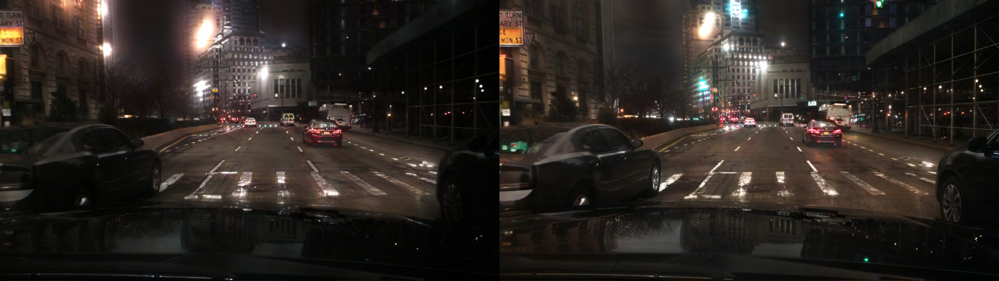

In [136]:
no_in = concat(image_no_in, image_in)
show(no_in)

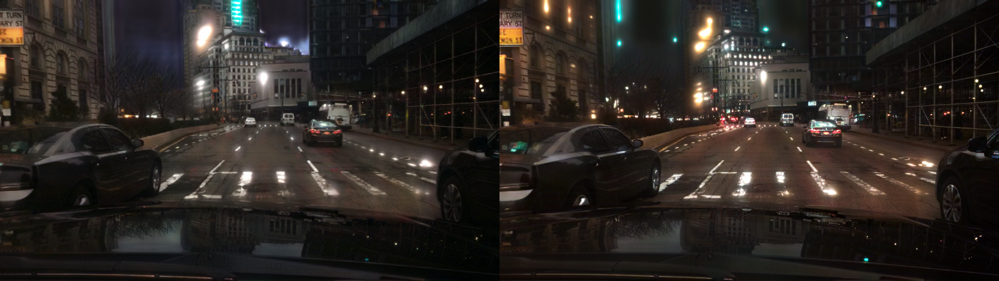

In [137]:
no_bn = concat(image_no_bn, image_bn)
show(no_bn)

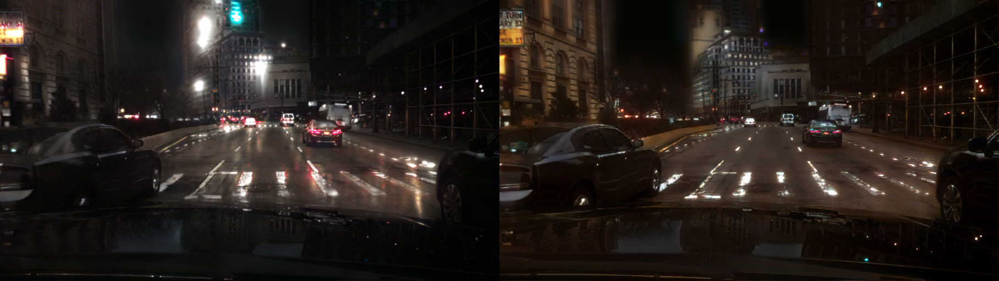

In [138]:
no_ln = concat(image_no_ln, image_ln)
show(no_ln)

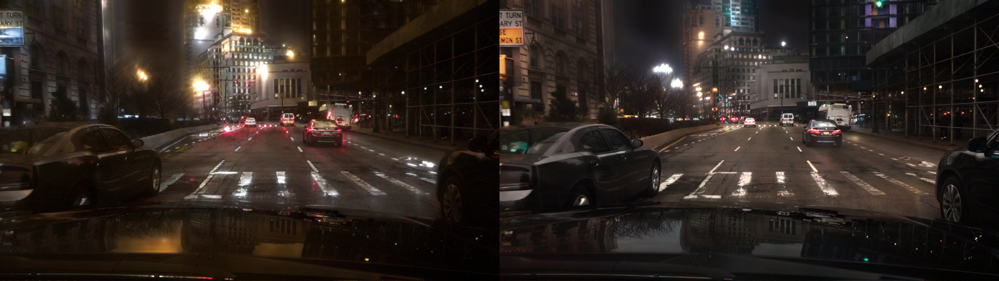

In [141]:
no_vgg = concat(image_unit, image_vgg)
show(no_vgg)

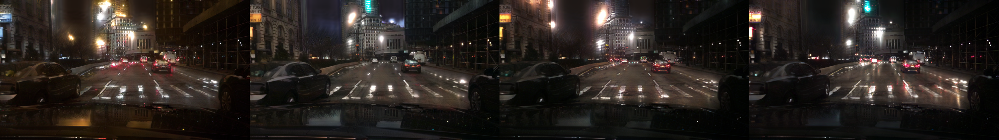

In [170]:
c = concat(image_unit, image_no_bn)
c = concat(c, image_no_in)
c = concat(c, image_no_ln)
show(c)
save(c, './no_vgg_cmp.png')

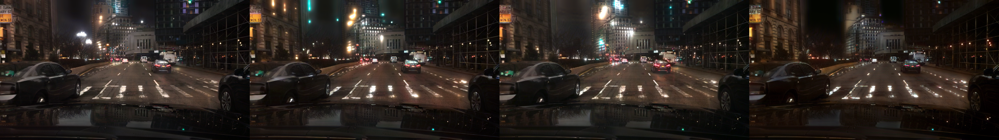

In [154]:
c = concat(image_vgg, image_bn)
c = concat(c, image_in)
c = concat(c, image_ln)
show(c)
save(c, './vgg_cmp.png')

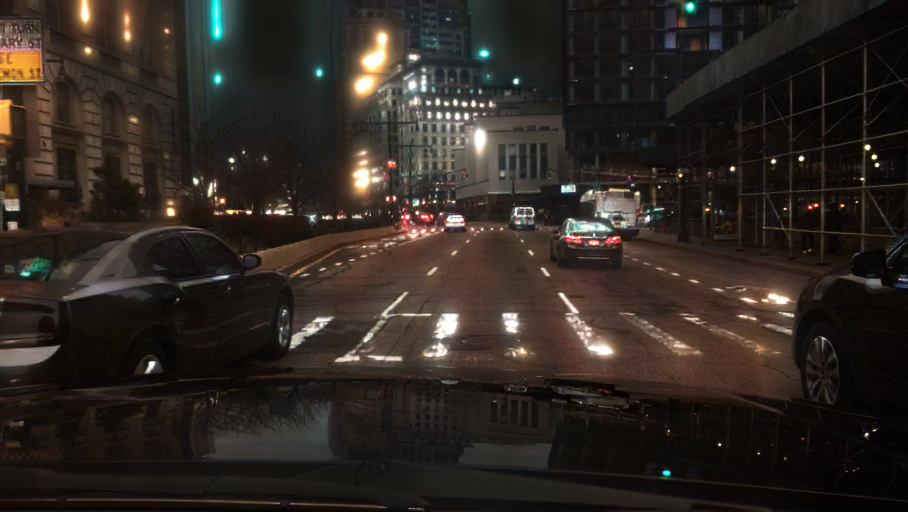

In [144]:
show(image_bn)

### Test Batch

In [ ]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/vgg"
checkpoint=f"{checkdir}/gen_01000000.pt"
config="configs/unit_day2night_vgg.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testA"
outdir=f"{checkdir}/out"
gpu=0
day2night=1
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

In [ ]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/vgg"
checkpoint=f"{checkdir}/gen_00800000.pt"
config="configs/unit_day2night_vgg.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testA"
outdir=f"{checkdir}/out800"
gpu=0
day2night=1
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

In [ ]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/vgg_in"
checkpoint=f"{checkdir}/gen_00633000.pt"
config="configs/unit_day2night_vgg_in.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testA"
outdir=f"{checkdir}/out633"
gpu=0
day2night=1
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

In [ ]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/vgg_ln"
checkpoint=f"{checkdir}/gen_01000000.pt"
config="configs/unit_day2night_vgg_128_ln.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testA"
outdir=f"{checkdir}/out"
gpu=0
day2night=1
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

In [ ]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/bdd_nexet"
checkpoint=f"{checkdir}/gen_00762000.pt"
config="configs/unit_day2night_bdd_nexet_vgg.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testA"
outdir=f"{checkdir}/out"
gpu=0
day2night=1
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

In [ ]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/bdd_nexet_vgg_in"
checkpoint=f"{checkdir}/gen_00651000.pt"
config="configs/unit_day2night_bdd_nexet_vgg_in.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testA"
outdir=f"{checkdir}/out"
gpu=0
day2night=1
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

In [ ]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/bdd_nexet_vgg_in"
checkpoint=f"{checkdir}/gen_00500000.pt"
config="configs/unit_day2night_bdd_nexet_vgg_in.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testA"
outdir=f"{checkdir}/out500"
gpu=0
day2night=1
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

In [ ]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/bdd_nexet_vgg_ln"
checkpoint=f"{checkdir}/gen_00510000.pt"
config="configs/unit_day2night_bdd_nexet_vgg_ln.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testA"
outdir=f"{checkdir}/out"
gpu=0
day2night=1
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

In [ ]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/512"
checkpoint=f"{checkdir}/gen_00758000.pt"
config="configs/unit_day2night_512.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testA"
outdir=f"{checkdir}/out"
gpu=0
day2night=1
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

In [ ]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/512_vgg"
checkpoint=f"{checkdir}/gen_00473000.pt"
config="configs/unit_day2night_512_vgg.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testA"
outdir=f"{checkdir}/out473"
gpu=0
day2night=1
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

In [40]:
%cd /mnt/w/prj/GraduateWork/day2night/UNIT/

checkdir="checkpoints/512_vgg"
checkpoint=f"{checkdir}/gen_00653000.pt"
config="configs/unit_day2night_512_vgg.yaml"
indir="/mnt/w/prj/data/nexet/nexet_2017_1/testA"
outdir=f"{checkdir}/out653"
gpu=0
day2night=1
number=200

!bash scripts/test.sh $checkdir $checkpoint $config $indir $outdir $number $gpu $day2night

/mnt/w/prj/GraduateWork/day2night/UNIT
------------------------------------------------------
UNIT | day2night | starting...
------------------------------------------------------
------------------------------------------------------
 Show all GPUs
------------------------------------------------------
index, name, driver_version, memory.total [MiB], memory.used [MiB], memory.free [MiB]
0, GeForce RTX 2080, 418.56, 7944 MiB, 958 MiB, 6986 MiB
------------------------------------------------------
------------------------------------------------------
 Starting tests... 
------------------------------------------------------
 Trainer: UNIT
 Use config: configs/unit_day2night_512_vgg.yaml
 Input folder: /mnt/w/prj/data/nexet/nexet_2017_1/testA
 Output folder: checkpoints/512_vgg/out653
 Checkpoint: checkpoints/512_vgg/gen_00653000.pt
 Domains: Day -> Night
 GPU: 0
 Number: 200
------------------------------------------------------
Launch testing script...
CUDA Devices
index, name, drive

/mnt/w/prj/data/nexet/nexet_2017_1/testA/1b75d788-13ab-4325-bf47-f737ab1d8f50.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/1cdd8673-5988-4a0d-ba84-4c2f1ebe2490.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/1e631661-e062-4fb1-9d5a-6a0cf1203242.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/1f31011e-3a8d-4409-a498-c764b611a519.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/2038cc05-dd4b-4978-93e1-53a04265dc7d.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/20f8d45a-2cc7-4860-a9f2-c3f707dea29e.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/210522f3-2dc2-4b3f-b08d-643f10bfa174.mov-0001.jpg --> checkpoints/512_vgg/out653                     

/mnt/w/prj/data/nexet/nexet_2017_1/testA/3c1210b8-6e9e-4fc5-a85a-94d6a87f672b.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/3c1e38cb-08c7-4fa6-8e8c-25a21cf1cafa.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/3c4bf095-1c78-421b-8f9e-4c9a285e78e5.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/3d5de078-e5a0-4f9a-b896-777fbf60d2bd.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/3e7c32a1-2957-4a07-a8bd-a3b3d14ef8c0.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/3e81ef36-8141-46ca-ab96-32d5afc83aa3.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/3f4db8fc-4462-467b-8626-99ab9facb3ae.mov-0001.jpg --> checkpoints/512_vgg/out653                     

/mnt/w/prj/data/nexet/nexet_2017_1/testA/6567e472-a622-4a7c-a3c4-a1865aec61c8.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/658dfd0a-d4b8-43aa-811a-041b4757f7cb.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/65e25ac4-dfcf-48d7-bd12-a1031645100a.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/665f58b1-b6ef-4533-9e9f-991b68d023f6.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/669a815a-b232-40c9-b9c9-0f588919f6b7.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/679aea26-6337-48e5-bbb8-354efb8309ed.mov-0001.jpg --> checkpoints/512_vgg/out653                     
/mnt/w/prj/data/nexet/nexet_2017_1/testA/67ff4a80-8cc5-4779-afba-f5fe59f96ac2.mov-0001.jpg --> checkpoints/512_vgg/out653                     